In [1]:
import zipfile
import numpy as np
import cv2
import tensorflow as tf
import os  
import shutil
import operator

from matplotlib import pyplot as plt
from PIL import Image
from numpy import array

# to have flot division!
from __future__ import division

def upload_files_local(mypath):
    from os import listdir
    from os.path import isfile, join
    return [join(mypath, f) for f in listdir(mypath) if isfile(join(mypath, f))]

def upload_files():
  from google.colab import files
  uploaded = files.upload()
  for k, v in uploaded.items():
    open(k, 'wb').write(v);
  return list(uploaded.keys())


def convert_to_opencv(image):
    # RGB -> BGR conversion is performed as well.
    r,g,b = np.array(image).T
    opencv_image = np.array([b,g,r]).transpose()
    return opencv_image

def crop_center(img,cropx,cropy):
    h, w = img.shape[:2]
    startx = w//2-(cropx//2)
    starty = h//2-(cropy//2)
    return img[starty:starty+cropy, startx:startx+cropx]

def resize_down_to_1600_max_dim(image):
    h, w = image.shape[:2]
    if (h < 1600 and w < 1600):
        return image

    new_size = (1600 * w // h, 1600) if (h > w) else (1600, 1600 * h // w)
    return cv2.resize(image, new_size, interpolation = cv2.INTER_LINEAR)

def resize_to_256_square(image):
    h, w = image.shape[:2]
    return cv2.resize(image, (256, 256), interpolation = cv2.INTER_LINEAR)

def read_tensor_from_image_file(file_name,
                                input_mean=0,
                                input_std=255):
  input_name = "file_reader"
  output_name = "normalized"
  file_reader = tf.read_file(file_name, input_name)
  if file_name.endswith(".png"):
    image_reader = tf.image.decode_png(
        file_reader, channels=3, name="png_reader")
  elif file_name.endswith(".gif"):
    image_reader = tf.squeeze(
        tf.image.decode_gif(file_reader, name="gif_reader"))
  elif file_name.endswith(".bmp"):
    image_reader = tf.image.decode_bmp(file_reader, name="bmp_reader")
  else:
    image_reader = tf.image.decode_jpeg(
        file_reader, channels=3, name="jpeg_reader")
  float_caster = tf.cast(image_reader, tf.float32)
  dims_expander = tf.expand_dims(float_caster, 0)
  resized = tf.image.resize_bilinear(dims_expander, [network_input_size, network_input_size])
  normalized = tf.divide(tf.subtract(resized, [input_mean]), [input_std])
  sess = tf.Session()
  result = sess.run(normalized)
  return result

def getImageForTF(imageFile):
  if(not custom):  
      image = Image.open(imageFile)
      image = convert_to_opencv(image)
      image = resize_down_to_1600_max_dim(image)
      h, w = image.shape[:2]
      min_dim = min(w,h)
      max_square_image = crop_center(image, min_dim, min_dim)
      augmented_image = resize_to_256_square(max_square_image)
      augmented_image = crop_center(augmented_image, network_input_size, network_input_size)
      return augmented_image
  else:
      return read_tensor_from_image_file(imageFile)
    
# check if the image with tensorflow is part of that class
def isthereflowerOfClass(image_to_test,realClass,labels):
  predictions = None
  if(custom):
      input_name = "Placeholder"
      output_name = "final_result"
      with tf.Session() as sess:
        input_operation = sess.graph.get_operation_by_name(input_name)
        output_operation = sess.graph.get_operation_by_name(output_name)
        results = sess.run(output_operation.outputs[0], {
            input_operation.outputs[0]: image_to_test
        })
      predictions = np.squeeze(results)   
  else:
    output_layer = 'loss:0'
    input_node = 'Placeholder:0'
    with tf.Session() as sess:
        prob_tensor = sess.graph.get_tensor_by_name(output_layer)
        predictions, = sess.run(prob_tensor, {input_node: [image_to_test] })

  label_index = 0
  classes = {} 
  for p in predictions:
    truncated_probablity = np.float64(round(p,8))
    classes[str(labels[label_index])] = truncated_probablity
    label_index += 1  

  classesOrdered = sorted(classes.items(), key=operator.itemgetter(1), reverse=True)
  
  foundBeforeFive = False
  positionHigh = 1
  for classHigh in classesOrdered:
    if(str(classHigh[0]) == str(realClass) and positionHigh < 6):
        foundBeforeFive = True
    positionHigh += 1
    
  highest_probability_index = np.argmax(predictions)
  #return top-1 and top-5  
  return(str(labels[highest_probability_index]) == str(realClass),foundBeforeFive)

c:\users\giora\appdata\local\programs\python\python36\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
def loadModelTf(modelName): 
  ModelsFolder = 'C:\\Users\\giora\\Desktop\\COMPUTER_VISION\\project\\'
    
  modelZip = str(ModelsFolder)+str(modelName)
    
  print(modelZip)
  #unzip the model
  import zipfile
  zip = zipfile.ZipFile(modelZip)
  zip.extractall('exportedModel')

  graph_def = tf.GraphDef()
  labels = []  

  filename = "./exportedModel/model.pb"
  labels_filename = "./exportedModel/labels.txt"

  # Import the TF graph
  with tf.gfile.FastGFile(filename, 'rb') as f:
      graph_def.ParseFromString(f.read())
      tf.import_graph_def(graph_def, name='')

  # Create a list of labels.
  with open(labels_filename, 'rt') as lf:
      for l in lf:
          labels.append(l.strip())
  flowersInClass("tulip",graph_def,labels)   

In [3]:
def flowersInClass(className,graph_def,labels):
  #upload all the images to test if it can find a flower in those
  imagesUploaded = upload_files_local(str(TestDatasetFolder)+str(className))

  countFlowerTop1 = 0 # no flowers at the beginning
  countFlowerTop5 = 0
    
  for image in imagesUploaded:
    imageTest = getImageForTF(image)
    
    foundTop = isthereflowerOfClass(imageTest,className,labels)
    
    if(foundTop[0]):
      countFlowerTop1 += 1
    
    if(foundTop[1]):
      countFlowerTop5 += 1
    else:
      display(Image.open(image))

  # end of for
  print("------------------------------")
  print("Results of "+str(className));
  print("Top-1: " +str(countFlowerTop1/len(imagesUploaded))+" found "+str(countFlowerTop1)+" out of "+str(len(imagesUploaded))) 
  print("Top-5: " +str(countFlowerTop5/len(imagesUploaded))+" found "+str(countFlowerTop5)+" out of "+str(len(imagesUploaded))) 

C:\Users\giora\Desktop\COMPUTER_VISION\project\custom-vision.zip


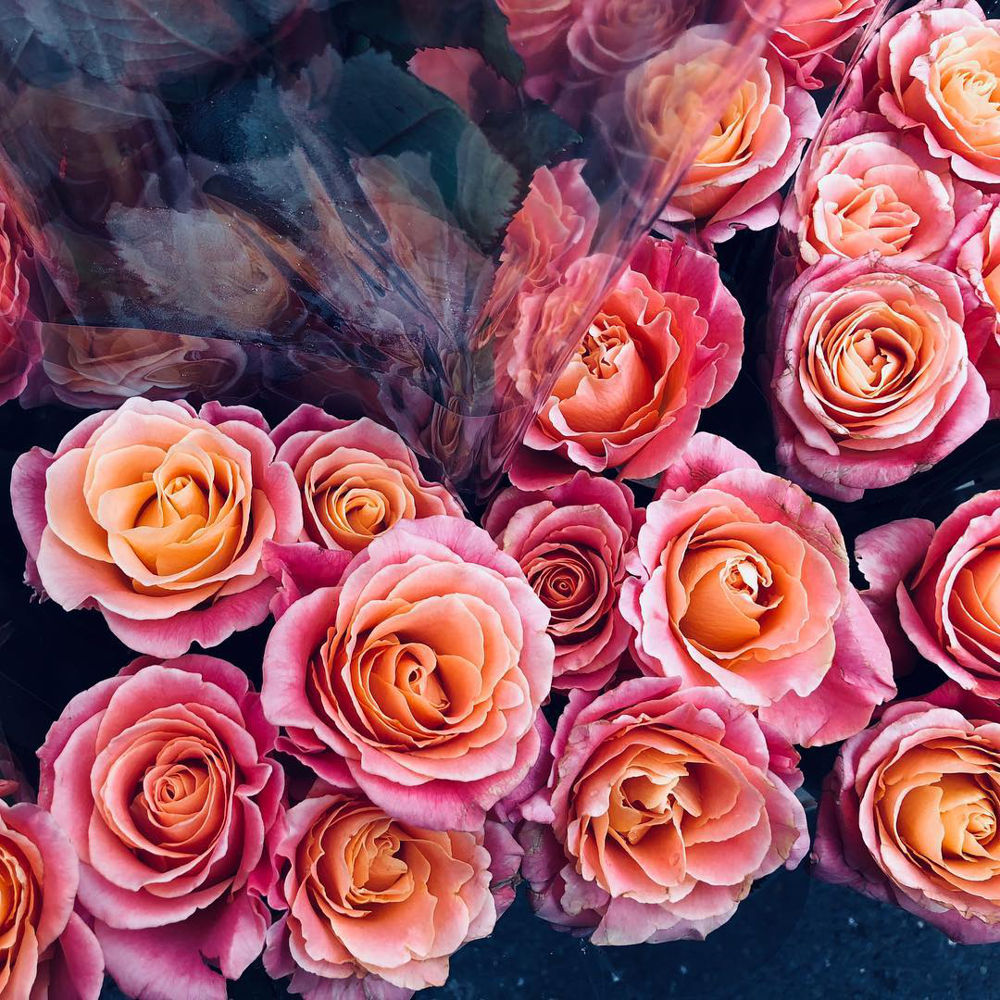

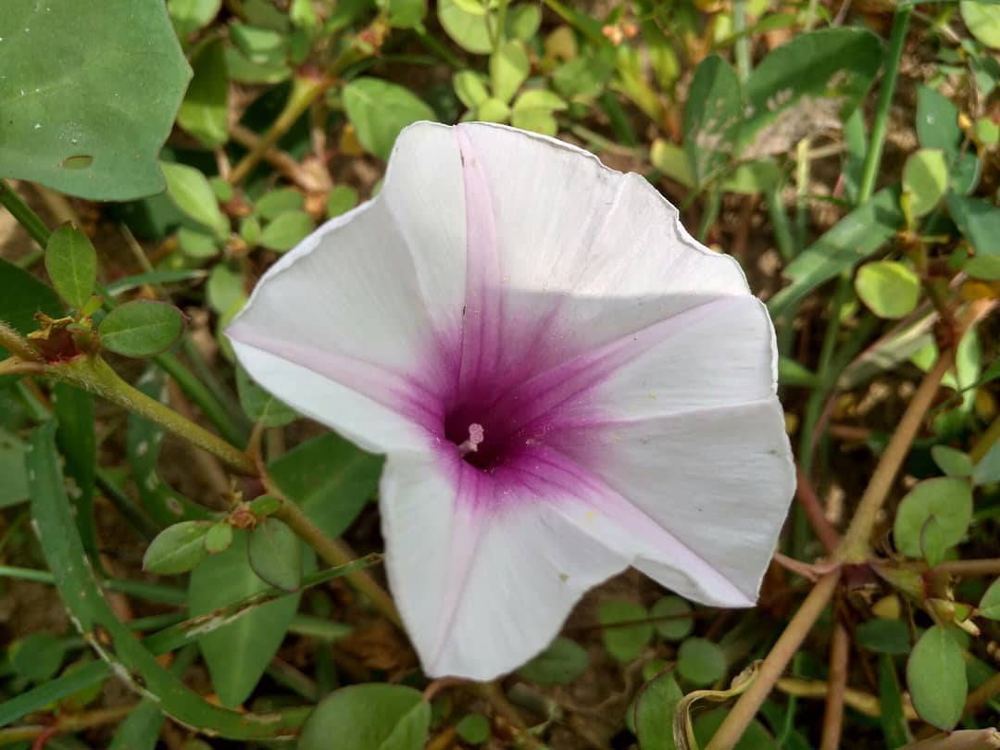

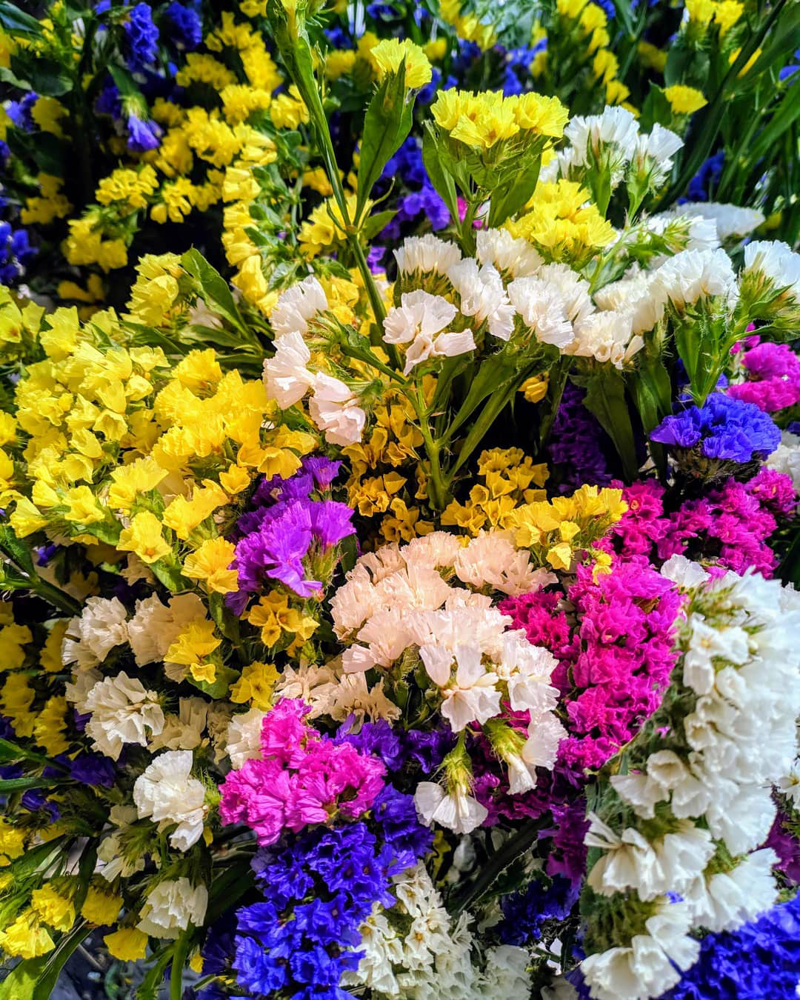

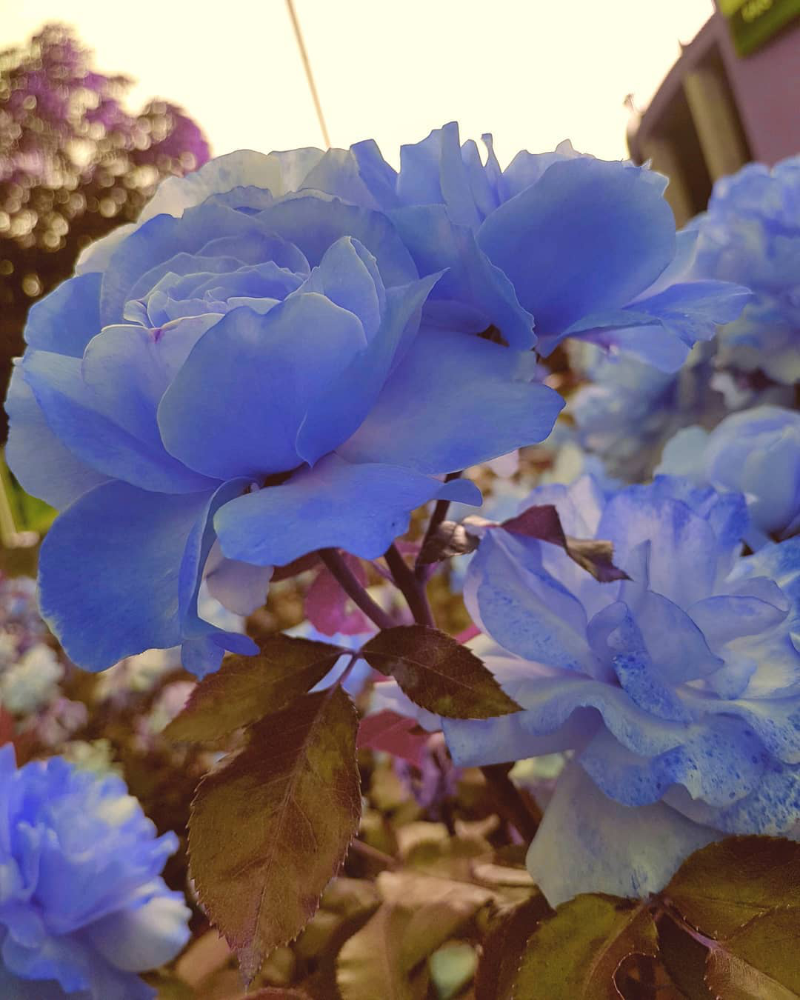

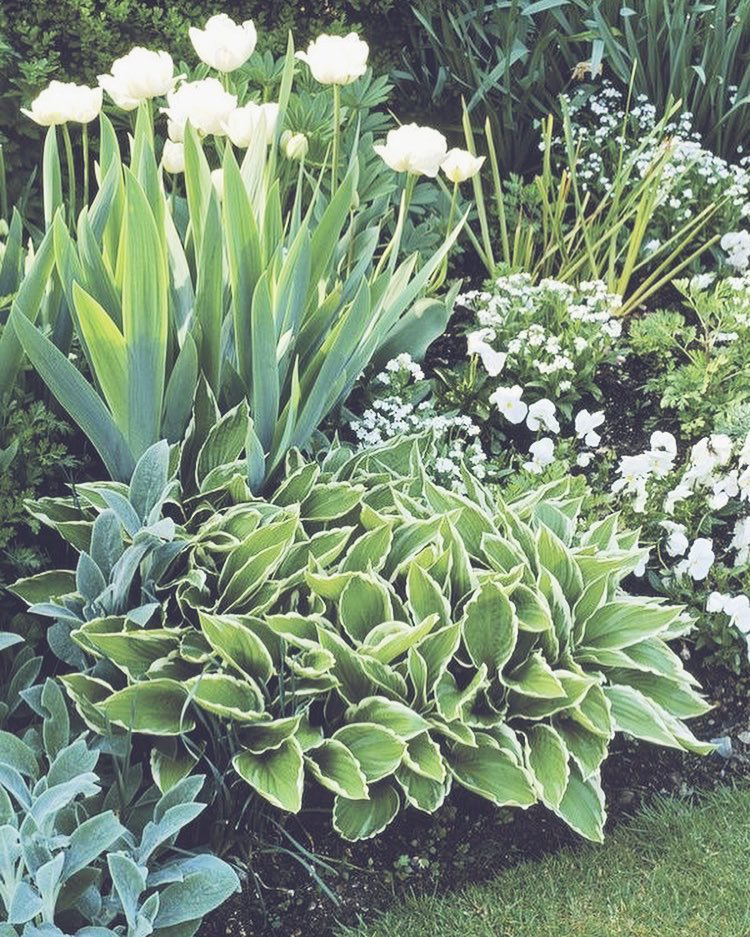

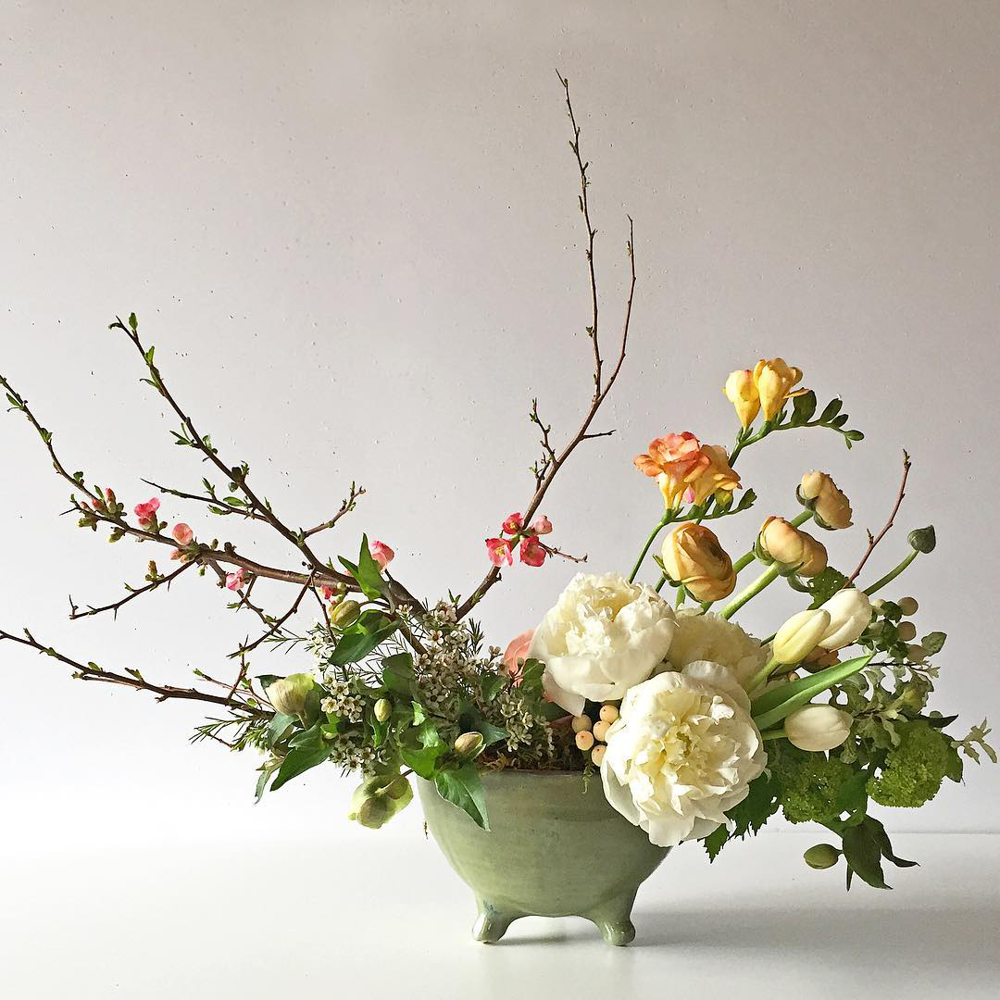

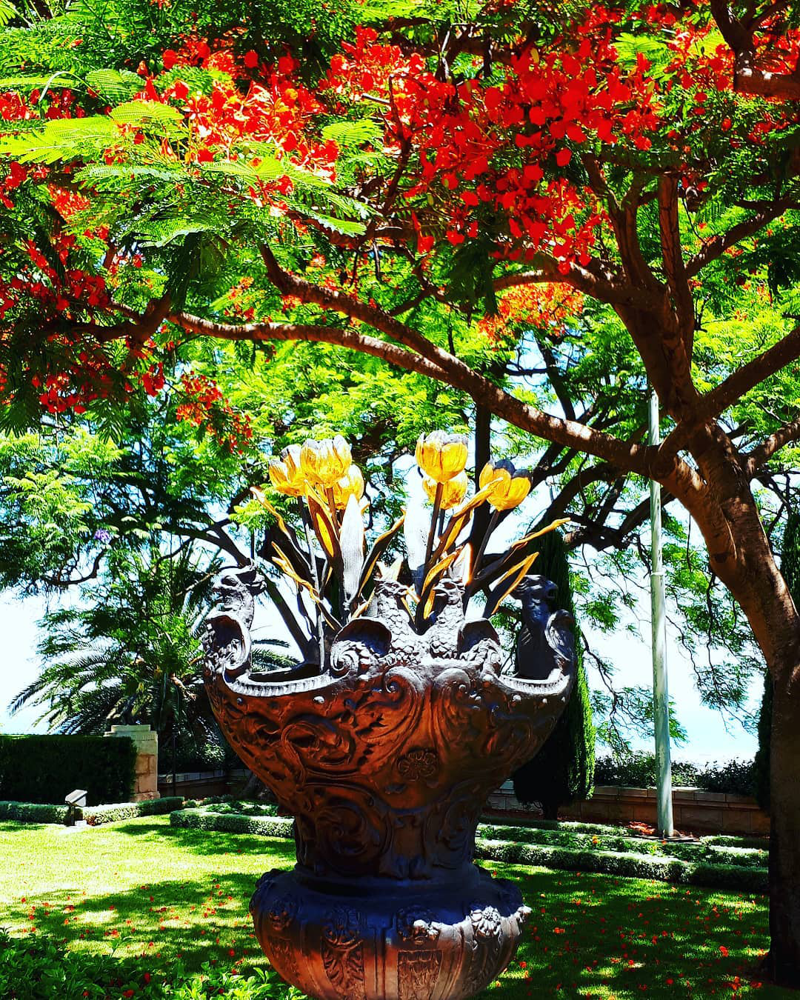

------------------------------
Results of tulip
Top-1: 0.48 found 48 out of 100
Top-5: 0.93 found 93 out of 100
38.43299317359924


In [4]:
## CUSTOM VISION AI
custom=False

tf.reset_default_graph()

import time
start = time.time()

TestDatasetFolder = r'C:\Users\giora\Desktop\COMPUTER_VISION\project\TEST2\\'
network_input_size = 227  
loadModelTf("custom-vision.zip")

done = time.time()
elapsed = done - start
print(elapsed)